# HCYOM target densities

This notebook looks at setting target densities for the HYCOM grid.
It may be the outcome is to just turn off the compressibility coefficient as after speaking to Angus, he indicated Andy had modified the target densities.

## Workings

The HYCOM grid is $z^{*}$ at the surface and transitions to isopycnals in the ocean interior.
To find the vertical grid at each timestep:

1. define a set of *target potential densities* and *minimum depths in $z^{*}$ space* for each interface (these should resolve interior wataer masses in the model)
2. find the vertical position of each target potential density in each water column (independently). This is done by interpolating from a density profile $\rho_{p} = \rho(S, \Theta, p_r + c(p-p_{r}))$ which has a compressible effect added with the coefficient $c$.
3. if the interpolated vertical position of the isopcynal is shallower than the minimum depth for a given layer, use $z^{*}$ else use isopycnal. However     "When regridding, an interface is only moved if this improves the fit to the target density."


In the case of ANU-TUB, Jan pointed out the compressibility coefficient $c$, which is set to 0.01, is making the density a linear function of pressure because the salinity is uniform and the temperature is very nearly uniform.
So the surfaces appear flat because they are stratified by the artifical compressibility.

We want to set $c=0$ in a run of ANU-TUB but this requires appropriately generating target density layers.
It is possible this has largely been taken into account by Andy already and all we need do is set $c=0$.

I should be able to manually generate the HYCOM grid.
Though I will use TEOS-10 and ANU-TUB uses Wright equation of state so there will be some subtle difference.

In [1]:
tub_output_dir = "/g/data/e14/jb2381/anu-tub/outputs"
if pwd() != tub_output_dir 
    cd(tub_output_dir)
end
include("plotting.jl")

  Activating project at `/g/data/e14/jb2381/anu-tub/outputs`
[ Info: Plotting and analysis environment setup!
┌ Info: Experiments in the catalogue are:
│        - zstar-PPMH3
│        - hycom-PPMH3
│        Available data is:
│           - daily
│           - monthly
│           - monthlyz
│           - monthlyrho2
│           - static
└           - vertical coordinate


## Vertical grid structure

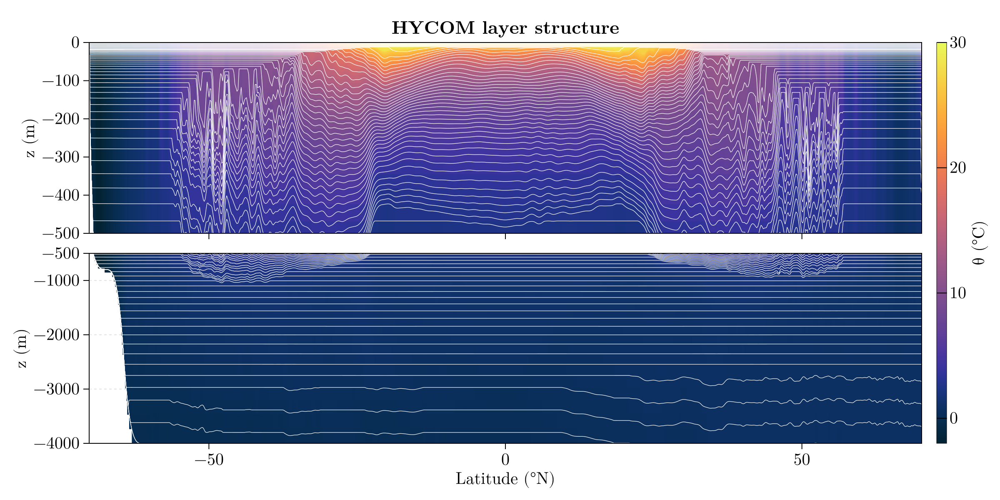

In [34]:
fig = Figure(size = (1200, 600))

colorrange = (-2, 30)
depth_levels = 1:75
k = "hycom-PPMH3"

crs = get_geo_coords(catalogue[k]["static"], catalogue[k]["vc"])

ds = NCDataset(catalogue[k]["monthly"], maskingvalue = NaN)
h = ds["thkcello"][80, :, :, 1] # middle of domain
close(ds)

∫h = cumsum(h, dims = 2)

ds = NCDataset(catalogue[k]["monthlyz"], maskingvalue = NaN)
θ = ds["thetao"][80, :, :, 1] # middle of domain
close(ds)

axtop = Axis(fig[1, 1], xlabel = "Latitude (°N)", ylabel = "z (m)", title = "HYCOM layer structure")
hidexdecorations!(axtop, ticks = false)
hm = heatmap!(axtop, crs.lath, crs.zl, θ; colorrange, colormap = :thermal)
for i ∈ depth_levels
    lines!(axtop, crs.lath, -∫h[:, i], color = :white, linewidth = 0.6)
end
ylims!(axtop, -500, 0)
axbot = Axis(fig[2, 1], xlabel = "Latitude (°N)", ylabel = "z (m)")
hm = heatmap!(axbot, crs.lath, crs.zl, θ; colorrange, colormap = :thermal)
for i ∈ depth_levels
    lines!(axbot, crs.lath, -∫h[:, i], color = :white, linewidth = 0.6)
end
ylims!(axbot, -4000, -500)
axbot.yticks = [-4000, -3000, -2000, -1000, -500]
Colorbar(fig[1:2, 2], hm, label = "θ (°C)")

fig

Can see this is flat in the deeper ocean and it is possible this is due to the subtle compressibilty added.

## HYCOM grid

In [13]:
hycom_file = "../input/anu-tub/hycom1_75_800m.nc"

"../input/anu-tub/hycom1_75_800m.nc"

In [14]:
ds = NCDataset(hycom_file)
target_densities = ds["sigma2"][:]
target_dz = ds["dz"][:]
close(ds)

closed Dataset

This file proivdes `dz`, the $z^{*}$ layer thickness (acccording to meta data).
Does this mean there is prescribed `dz` between layers or is `dz` referring to minimum depth from surface at which the density would be found?
Adcroft et al. (2019) indicates minimum depth but it looks more like providing dz between layers.
Be good to find another file to check this against.

In the source code the HYCOM grid is built like this

```fortran
subroutine build_grid_HyCOM1( G, GV, US, h, nom_depth_H, tv, h_new, dzInterface, remapCS, CS, frac_shelf_h, zScale )
  type(ocean_grid_type),                     intent(in)    :: G  !< Grid structure
  type(verticalGrid_type),                   intent(in)    :: GV !< Ocean vertical grid structure
  type(unit_scale_type),                     intent(in)    :: US !< A dimensional unit scaling type
  real, dimension(SZI_(G),SZJ_(G),SZK_(GV)), intent(in)    :: h  !< Existing model thickness [H ~> m or kg m-2]
  real, dimension(SZI_(G),SZJ_(G)),          intent(in)    :: nom_depth_H !< The bathymetric depth of this column
                                                                 !! relative to mean sea level or another locally
                                                                 !! valid reference height, converted to thickness
                                                                 !! units [H ~> m or kg m-2]
  type(thermo_var_ptrs),                     intent(in)    :: tv !< Thermodynamics structure
  type(remapping_CS),                        intent(in)    :: remapCS !< The remapping control structure
  type(regridding_CS),                       intent(in)    :: CS !< Regridding control structure
  real, dimension(SZI_(G),SZJ_(G),CS%nk),    intent(inout) :: h_new !< New layer thicknesses [H ~> m or kg m-2]
  real, dimension(SZI_(G),SZJ_(G),CS%nk+1),  intent(inout) :: dzInterface !< Changes in interface position
                                                                 !! in thickness units [H ~> m or kg m-2]
  real, dimension(SZI_(G),SZJ_(G)), optional, intent(in)   :: frac_shelf_h !< Fractional ice shelf
                                                                 !! coverage [nondim]
  real,                            optional, intent(in)    :: zScale !< Scaling factor from the target coordinate
                                                                 !! resolution in Z to desired units for zInterface,
                                                                 !! usually Z_to_H in which case it is in
                                                                 !! units of [H Z-1 ~> nondim or kg m-3]

  ! Local variables
  real, dimension(SZK_(GV)+1) :: z_col  ! Source interface positions relative to the surface [H ~> m or kg m-2]
  real, dimension(SZK_(GV))   :: p_col  ! Layer center pressure in the input column [R L2 T-2 ~> Pa]
  real, dimension(CS%nk+1) :: z_col_new ! New interface positions relative to the surface [H ~> m or kg m-2]
  real, dimension(CS%nk+1) :: dz_col    ! The realized change in z_col [H ~> m or kg m-2]
  real :: nominalDepth    ! The nominal depth of the seafloor in thickness units [H ~> m or kg m-2]
  real :: h_neglect, h_neglect_edge ! Negligible thicknesses used for remapping [H ~> m or kg m-2]
  real :: z_top_col       ! The nominal height of the sea surface or ice-ocean interface
                          ! in thickness units [H ~> m or kg m-2]
  real :: totalThickness  ! The total thickness of the water column [H ~> m or kg m-2]
  logical :: ice_shelf
  integer :: i, j, k, nki

  h_neglect = set_h_neglect(GV, CS%remap_answer_date, h_neglect_edge)

  if (.not.CS%target_density_set) call MOM_error(FATAL, "build_grid_HyCOM1 : "//&
        "Target densities must be set before build_grid_HyCOM1 is called.")

  nki = min(GV%ke, CS%nk)
  ice_shelf = present(frac_shelf_h)

  ! Build grid based on target interface densities
  do j = G%jsc-1,G%jec+1 ; do i = G%isc-1,G%iec+1
    if (G%mask2dT(i,j)>0.) then

      nominalDepth = nom_depth_H(i,j)

      if (ice_shelf) then
        totalThickness = 0.0
        do k=1,GV%ke
          totalThickness = totalThickness + h(i,j,k)
        enddo
        z_top_col = max(nominalDepth-totalThickness,0.0)
      else
        z_top_col = 0.0
      endif

      z_col(1) = z_top_col ! Work downward rather than bottom up
      do K = 1, GV%ke
        z_col(K+1) = z_col(K) + h(i,j,k)
        p_col(k) = tv%P_Ref + CS%compressibility_fraction * &
             ( 0.5 * ( z_col(K) + z_col(K+1) ) * (GV%H_to_RZ*GV%g_Earth) - tv%P_Ref )
      enddo

      call build_hycom1_column(CS%hycom_CS, remapCS, tv%eqn_of_state, GV%ke, nominalDepth, &
           h(i,j,:), tv%T(i,j,:), tv%S(i,j,:), p_col, &
           z_col, z_col_new, zScale=zScale, &
           h_neglect=h_neglect, h_neglect_edge=h_neglect_edge)

      ! Calculate the final change in grid position after blending new and old grids
      call filtered_grid_motion( CS, GV%ke, z_col, z_col_new, dz_col )

      ! This adjusts things robust to round-off errors
      dz_col(:) = -dz_col(:)
      call adjust_interface_motion( CS, GV%ke, h(i,j,:), dz_col(:) )

      dzInterface(i,j,1:nki+1) = dz_col(1:nki+1)
      if (nki<CS%nk) dzInterface(i,j,nki+2:CS%nk+1) = 0.

    else ! on land
      dzInterface(i,j,:) = 0.
    endif ! mask2dT
  enddo ; enddo ! i,j

  call calc_h_new_by_dz(CS, G, GV, h, dzInterface, h_new)

end subroutine build_grid_HyCOM1
```

with

```fortran
subroutine build_hycom1_column(CS, remapCS, eqn_of_state, nz, depth, h, T, S, p_col, &
                               z_col, z_col_new, zScale, h_neglect, h_neglect_edge)
  type(hycom_CS),        intent(in)    :: CS    !< Coordinate control structure
  type(remapping_CS),    intent(in)    :: remapCS !< Remapping parameters and options
  type(EOS_type),        intent(in)    :: eqn_of_state !< Equation of state structure
  integer,               intent(in)    :: nz    !< Number of levels
  real,                  intent(in)    :: depth !< Depth of ocean bottom (positive [H ~> m or kg m-2])
  real, dimension(nz),   intent(in)    :: T     !< Temperature of column [C ~> degC]
  real, dimension(nz),   intent(in)    :: S     !< Salinity of column [S ~> ppt]
  real, dimension(nz),   intent(in)    :: h     !< Layer thicknesses [H ~> m or kg m-2]
  real, dimension(nz),   intent(in)    :: p_col !< Layer pressure [R L2 T-2 ~> Pa]
  real, dimension(nz+1), intent(in)    :: z_col !< Interface positions relative to the surface [H ~> m or kg m-2]
  real, dimension(CS%nk+1), intent(inout) :: z_col_new !< Absolute positions of interfaces [H ~> m or kg m-2]
  real, optional,        intent(in)    :: zScale !< Scaling factor from the input coordinate thicknesses in [Z ~> m]
                                                !! to desired units for zInterface, perhaps GV%Z_to_H in which
                                                !! case this has units of [H Z-1 ~> nondim or kg m-3]
  real,                  intent(in)    :: h_neglect !< A negligibly small width for the purpose of
                                                !! cell reconstruction [H ~> m or kg m-2]
  real,        optional, intent(in)    :: h_neglect_edge !< A negligibly small width for the purpose of
                                                !! edge value calculation [H ~> m or kg m-2]

  ! Local variables
  integer   :: k
  real, dimension(nz)      :: rho_col   ! Layer densities in a column [R ~> kg m-3]
  real, dimension(CS%nk)   :: h_col_new ! New layer thicknesses [H ~> m or kg m-2]
  real, dimension(CS%nk)   :: r_col_new ! New layer densities [R ~> kg m-3]
  real, dimension(CS%nk)   :: T_col_new ! New layer temperatures [C ~> degC]
  real, dimension(CS%nk)   :: S_col_new ! New layer salinities [S ~> ppt]
  real, dimension(CS%nk)   :: p_col_new ! New layer pressure [R L2 T-2 ~> Pa]
  real, dimension(CS%nk+1) :: RiA_ini   ! Initial nk+1 interface density anomaly w.r.t. the
                                        ! interface target densities [R ~> kg m-3]
  real, dimension(CS%nk+1) :: RiA_new   ! New interface density anomaly w.r.t. the
                                        ! interface target densities [R ~> kg m-3]
  real :: z_1, z_nz  ! mid point of 1st and last layers [H ~> m or kg m-2]
  real :: z_scale    ! A scaling factor from the input thicknesses to the target thicknesses,
                     ! perhaps 1 or a factor in [H Z-1 ~> 1 or kg m-3]
  real :: stretching ! z* stretching, converts z* to z [nondim].
  real :: nominal_z ! Nominal depth of interface when using z* [H ~> m or kg m-2]
  logical :: maximum_depths_set ! If true, the maximum depths of interface have been set.
  logical :: maximum_h_set      ! If true, the maximum layer thicknesses have been set.

  maximum_depths_set = allocated(CS%max_interface_depths)
  maximum_h_set = allocated(CS%max_layer_thickness)

  z_scale = 1.0 ; if (present(zScale)) z_scale = zScale

  if (CS%only_improves .and. nz == CS%nk) then
    call build_hycom1_target_anomaly(CS, remapCS, eqn_of_state, CS%nk, depth, &
        h, T, S, p_col, rho_col, RiA_ini, h_neglect, h_neglect_edge)
  else
    ! Work bottom recording potential density
    call calculate_density(T, S, p_col, rho_col, eqn_of_state)
    ! This ensures the potential density profile is monotonic
    ! although not necessarily single valued.
    do k = nz-1, 1, -1
      rho_col(k) = min( rho_col(k), rho_col(k+1) )
    enddo
  endif

  ! Interpolates for the target interface position with the rho_col profile
  ! Based on global density profile, interpolate to generate a new grid
  call build_and_interpolate_grid(CS%interp_CS, rho_col, nz, h(:), z_col, &
           CS%target_density, CS%nk, h_col_new, z_col_new, h_neglect, h_neglect_edge)
  if (CS%only_improves .and. nz == CS%nk) then
    ! Only move an interface if it improves the density fit
    z_1 = 0.5 * ( z_col(1) + z_col(2) )
    z_nz  = 0.5 * ( z_col(nz) + z_col(nz+1) )
    do k = 1,CS%nk
      p_col_new(k) = p_col(1) + ( 0.5 * ( z_col_new(K) + z_col_new(K+1) ) - z_1 ) / ( z_nz - z_1 ) * &
          ( p_col(nz) - p_col(1) )
    enddo
    ! Remap from original h and T,S to get T,S_col_new
    call remapping_core_h(remapCS, nz, h(:), T, CS%nk, h_col_new, T_col_new)
    call remapping_core_h(remapCS, nz, h(:), S, CS%nk, h_col_new, S_col_new)
    call build_hycom1_target_anomaly(CS, remapCS, eqn_of_state, CS%nk, depth, &
        h_col_new, T_col_new, S_col_new, p_col_new, r_col_new, RiA_new, h_neglect, h_neglect_edge)
    do k= 2,CS%nk
      if     ( abs(RiA_ini(K)) <= abs(RiA_new(K)) .and. z_col(K) > z_col_new(K-1) .and. &
               z_col(K) < z_col_new(K+1)) then
        z_col_new(K) = z_col(K)
      endif
    enddo
  endif !only_improves

  ! Sweep down the interfaces and make sure that the interface is at least
  ! as deep as a nominal target z* grid
  nominal_z = 0.
  stretching = z_col(nz+1) / depth ! Stretches z* to z
  do k = 2, CS%nk+1
    nominal_z = nominal_z + (z_scale * CS%coordinateResolution(k-1)) * stretching
    z_col_new(k) = max( z_col_new(k), nominal_z )
    z_col_new(k) = min( z_col_new(k), z_col(nz+1) )
  enddo

  if (maximum_depths_set .and. maximum_h_set) then ; do k=2,CS%nk
    ! The loop bounds are 2 & nz so the top and bottom interfaces do not move.
    ! Recall that z_col_new is positive downward.
    z_col_new(K) = min(z_col_new(K), CS%max_interface_depths(K), &
                       z_col_new(K-1) + CS%max_layer_thickness(k-1))
  enddo ; elseif (maximum_depths_set) then ; do K=2,CS%nk
    z_col_new(K) = min(z_col_new(K), CS%max_interface_depths(K))
  enddo ; elseif (maximum_h_set) then ; do k=2,CS%nk
    z_col_new(K) = min(z_col_new(K), z_col_new(K-1) + CS%max_layer_thickness(k-1))
  enddo ; endif
end subroutine build_hycom1_column
```

## Layer grid

In [44]:
ds = NCDataset(catalogue["hycom-PPMH3"]["monthly"], maskingvalue = NaN)
σ2 = ds["rhopot2"][80, :, :, 1]
xh = ds["xh"][:]
yh = ds["yh"][:]
z = ds["zl"][:]
close(ds)

closed Dataset

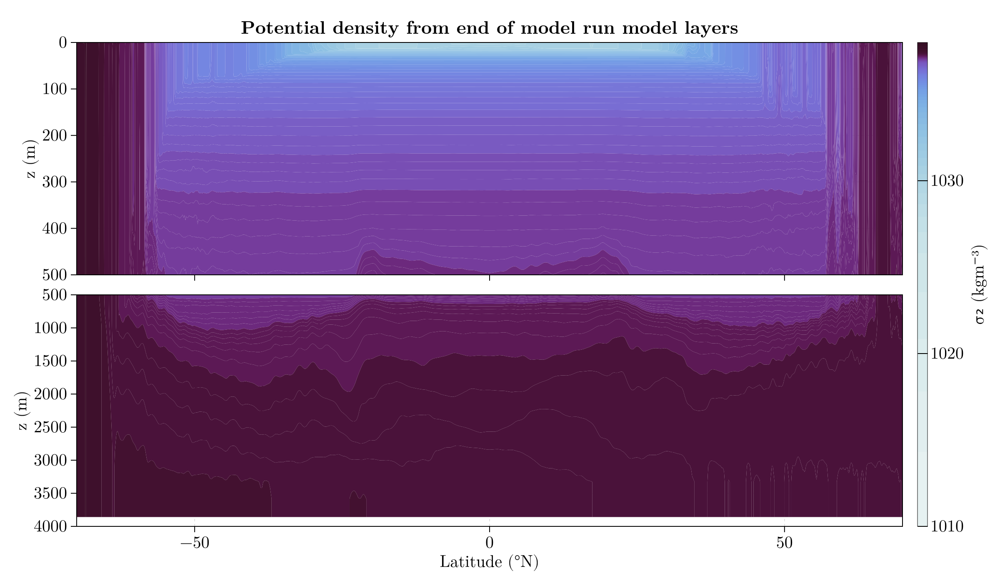

In [45]:
fig = Figure(size = (1200, 700))
colormap = :dense

axtop = Axis(fig[1, 1], xlabel = "Latitude (°N)", ylabel = "z (m)", title = "Potential density from end of model run model layers")
hidexdecorations!(axtop, ticks = false)
hm = contourf!(axtop, yh, z, σ2; colormap, levels = target_densities)
xlims!(axtop, -70, 70)
ylims!(axtop, 0, 500)
axtop.yreversed = true

axbot = Axis(fig[2, 1], xlabel = "Latitude (°N)", ylabel = "z (m)", yreversed = true)
hm = contourf!(axbot, yh, z, σ2; colormap, levels = target_densities)
xlims!(axbot, -70, 70)
ylims!(axbot, 500, 4000)
axbot.yreversed = true

Colorbar(fig[1:2, 2], hm, label = "σ₂ (kgm⁻³)")

fig

Comparing this to the layers on top of the temperature field above is not that useful.

## Z grid

In [145]:
ds = NCDataset(catalogue["hycom-PPMH3"]["monthlyz"], maskingvalue = NaN)
σ2_z = ds["rhopot2"][80, :, :, 1]
close(ds)

closed Dataset

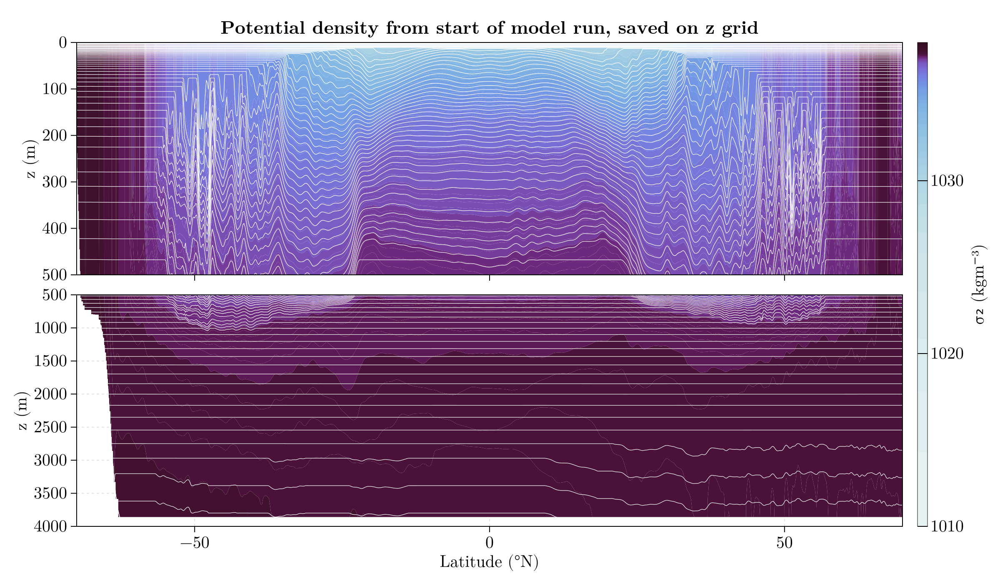

In [135]:
fig = Figure(size = (1200, 700))
colormap = :dense

axtop = Axis(fig[1, 1], xlabel = "Latitude (°N)", ylabel = "z (m)", title = "Potential density from start of model run, saved on z grid")
hidexdecorations!(axtop, ticks = false)
hm = contourf!(axtop, yh, z, σ2_z; colormap, levels = target_densities)
for i ∈ depth_levels
    lines!(axtop, yh, ∫h[:, i], color = :white, linewidth = 0.6)
end
xlims!(axtop, -70, 70)
ylims!(axtop, 0, 500)
axtop.yreversed = true

axbot = Axis(fig[2, 1], xlabel = "Latitude (°N)", ylabel = "z (m)", yreversed = true)
hm = contourf!(axbot, yh, z, σ2_z; colormap, levels = target_densities)
for i ∈ depth_levels
    lines!(axbot, yh, ∫h[:, i], color = :white, linewidth = 0.6)
end
xlims!(axbot, -70, 70)
ylims!(axbot, 500, 4000)
axbot.yreversed = true

Colorbar(fig[1:2, 2], hm, label = "σ₂ (kgm⁻³)")

fig

This is the one to compare the layers to.
Can see the strucutre in the interior matching quite well the layers above i.e. that model is trying to find the layers and it is doing a good job from -50 to 50 and to around 800m depth.
What the layers are *not* capturing is what we expect to see at higher latitudes and the deeper ocean where it is just $z^{*}$.
This must be because either:
- the depth of the interface is shallower minimum depth of the target density surface
- the compressibilitity is adding stratification.
Looking at the plot my guess is the first is why we see $z^{*}$ at high latitudes in the upper ocean. In Adcroft et al. (2019) this is stated as a limitation.
While in the interior where we are seeing $z^{*}$ this is related to the second point.

I *should* be able to estimate the HYCOM grid with TEOS-10.
The process of building the HYCOM grid in MOM6 is in `build_HyCOM1_grid`, spelling important for searching, and `build_hycom_column`.

## HYCOM grid approximation with TEOS-10

In [154]:
ds = NCDataset(catalogue["hycom-PPMH3"]["monthly"], maskingvalue = NaN)
h = ds["thkcello"][80, :, :, 1]
xh = ds["xh"][:]
yh = ds["yh"][:]
z = ds["zl"][:]
close(ds)

ds = NCDataset(catalogue["hycom-PPMH3"]["monthlyz"], maskingvalue = NaN)
θ = ds["thetao"][80, :, :, 1]
close(ds)

S = 35

35

In [155]:
pref = 2000
ztop = 0
c = 0.01
interface_depths = Array{Float64}(undef, length(yh),  length(z) + 1)
interface_depths[:, 1] .= ztop
interface_depths[:, 2:end] .= nancumsum(h, dims = 2)
hpoint_depths = 0.5 * (interface_depths[:, 1:end-1] .+ interface_depths[:, 2:end])
hpoint_pressure = gsw_p_from_z.(-hpoint_depths, yh)

mild_compressibility(p, c, pref) = pref + c * (p - pref)
offline_p = mild_compressibility.(hpoint_pressure, c, pref)

σ2_offline = gsw_rho.(S, θ, offline_p)
nothing

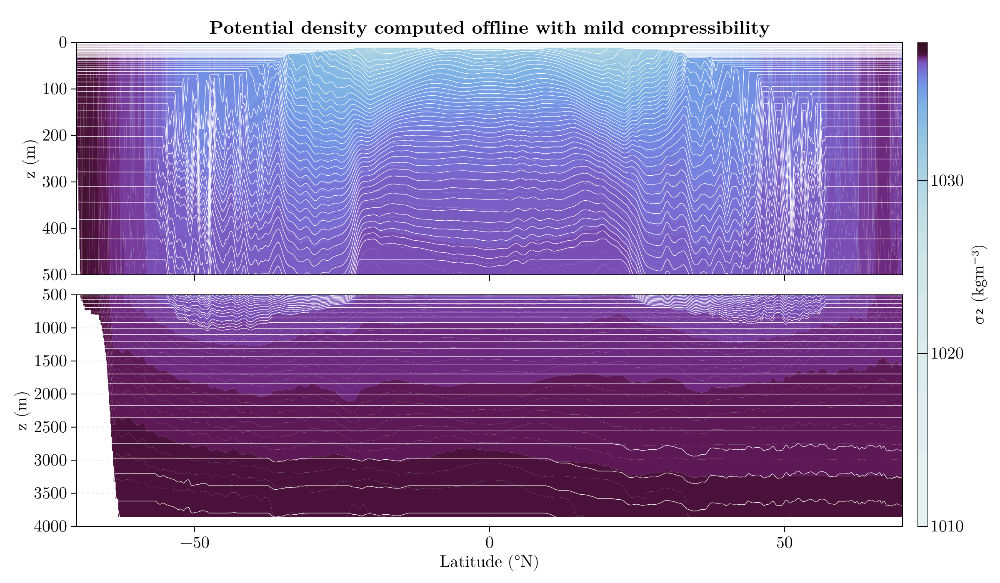

In [156]:
fig = Figure(size = (1200, 700))
colormap = :dense

axtop = Axis(fig[1, 1], xlabel = "Latitude (°N)", ylabel = "z (m)", title = "Potential density computed offline with mild compressibility")
hidexdecorations!(axtop, ticks = false)
hm = contourf!(axtop, yh, z, σ2_offline; colormap, levels = target_densities)
for i ∈ axes(interface_depths, 2)
    lines!(axtop, yh, interface_depths[:, i], color = :white, linewidth = 0.6)
end
xlims!(axtop, -70, 70)
ylims!(axtop, 0, 500)
axtop.yreversed = true

axbot = Axis(fig[2, 1], xlabel = "Latitude (°N)", ylabel = "z (m)", yreversed = true)
hm = contourf!(axbot, yh, z, σ2_offline; colormap, levels = target_densities)
for i ∈ axes(interface_depths, 2)
    lines!(axbot, yh, interface_depths[:, i], color = :white, linewidth = 0.6)
end
xlims!(axbot, -70, 70)
ylims!(axbot, 500, 4000)
axbot.yreversed = true

Colorbar(fig[1:2, 2], hm, label = "σ₂ (kgm⁻³)")

fig

Given the HYCOM grid generation does not move the grid unless it is worth it this seems to be doing a pretty good job.

## Creating new target densities

The above computation of density is approximately what the model will see (equaiton of state is Wright (1997) and not TEOs-10). Looking at the plots, in the upper ocean the surfaces (white lines) do seem to get moved towards the target densities (lighter lines) so it is doing ok there. But the deep ocean is not as dense as the target densities:

I think I should be able to create target densities that are a better representation of the model in the deep ocean with and without the compressibility coefficient using the above computation.

In [142]:
maximum(target_densities), nanmaximum(σ2_offline)

(1038.0, 1037.4455743317972)

So I think I should be able to create target densities that are a better representation of the model in the deep ocean with and without the compressibility coefficient set to zero. At least that is my goal!

To do this make the densest water less dense (maybe 1037.55 to cover both), the make layers in the deep ocean a bit closer together. Ideally this will give a better spread of densities over the ranges we are looking at. This should be tailored to both individually.

## No compressibility coefficient

i.e. we would set $c=0$ in the `MOM_input`.

In [146]:
pref = 2000
ztop = 0
c = 0
interface_depths = Array{Float64}(undef, length(yh),  length(z) + 1)
interface_depths[:, 1] .= ztop
interface_depths[:, 2:end] .= nancumsum(h, dims = 2)
hpoint_depths = 0.5 * (interface_depths[:, 1:end-1] .+ interface_depths[:, 2:end])
hpoint_pressure = gsw_p_from_z.(-hpoint_depths, yh)

mild_compressibility(p, c, pref) = pref + c * (p - pref)
offline_p = mild_compressibility.(hpoint_pressure, c, pref)

σ2_offline = gsw_rho.(S, θ, offline_p)
nothing

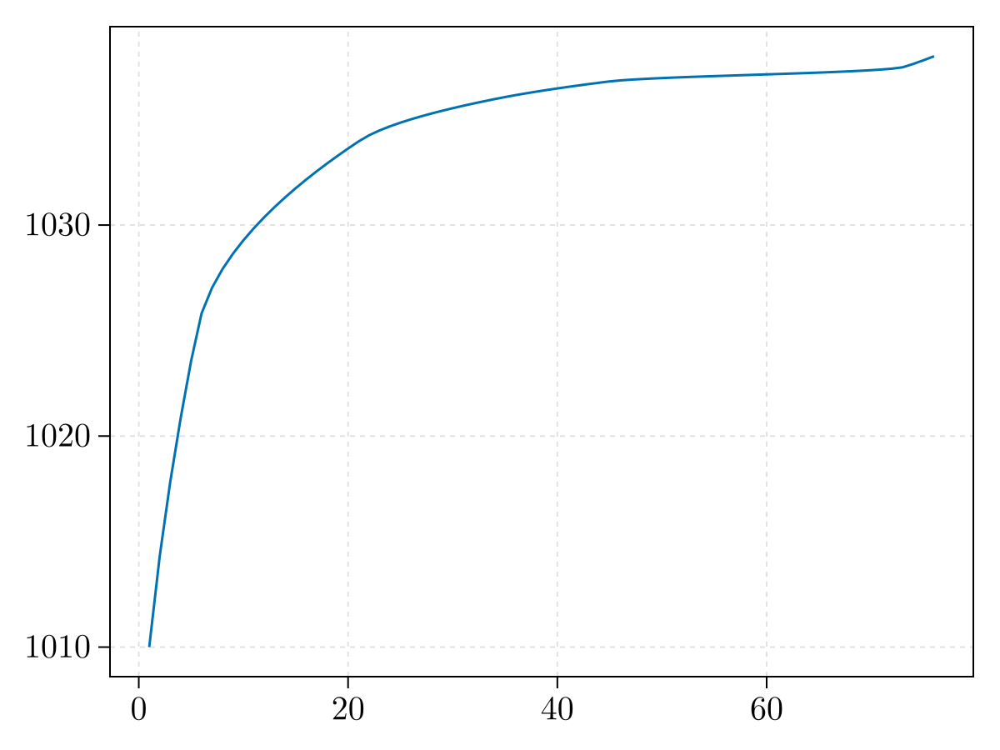

In [147]:
c_0_target_densities = similar(target_densities)
c_0_target_densities .= target_densities
lines(c_0_target_densities)

In [153]:
println("Minimum density in snapshot: $(nanminimum(σ2_offline))")
println("Maximum density in snapshot: $(nanmaximum(σ2_offline))")
new_densest = 1037.8
println("Set new maximum density: $new_densest")
density_diff = maximum(target_densities) - new_densest
println("Difference between old and new max: $density_diff")

Minimum density in snapshot: 1029.9657062909175
Maximum density in snapshot: 1037.5092945214813
Set new maximum density: 1037.8
Difference between old and new max: 0.20000000000004547


Does not seem to be too much if any wiggle room to set new target densities.
Maybe a better option is to just set the compressibility coefficient to zero and see what happens.
The isopycnals are more steeply sloped and, if the `rhopot2` model output is the better representation of what would be computed with $c=0$, I would guess this should move the surfaces more.
At least worth a try!

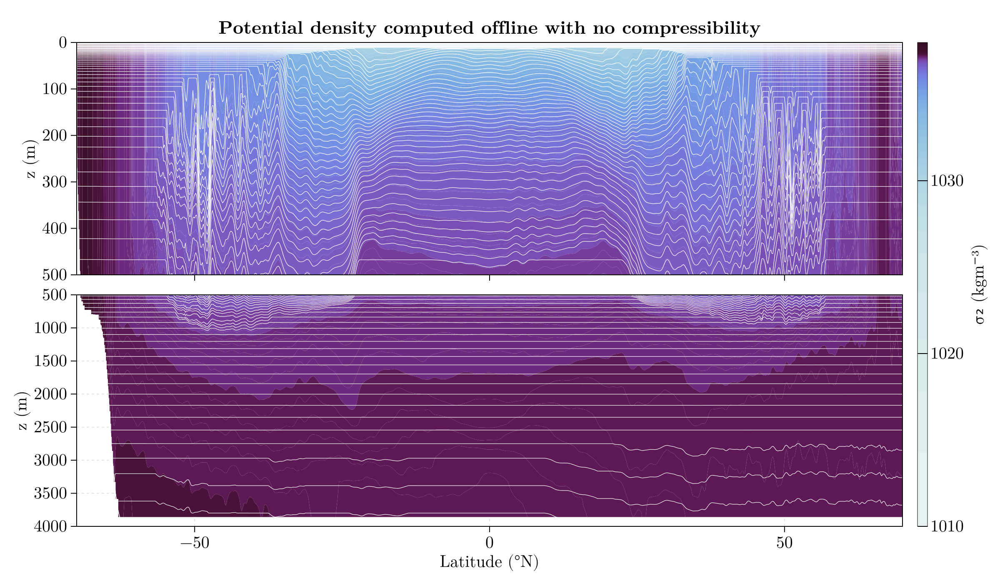

In [152]:
fig = Figure(size = (1200, 700))
colormap = :dense

axtop = Axis(fig[1, 1], xlabel = "Latitude (°N)", ylabel = "z (m)", title = "Potential density computed offline with no compressibility")
hidexdecorations!(axtop, ticks = false)
hm = contourf!(axtop, yh, z, σ2_offline; colormap, levels = target_densities)
for i ∈ axes(interface_depths, 2)
    lines!(axtop, yh, interface_depths[:, i], color = :white, linewidth = 0.6)
end
xlims!(axtop, -70, 70)
ylims!(axtop, 0, 500)
axtop.yreversed = true

axbot = Axis(fig[2, 1], xlabel = "Latitude (°N)", ylabel = "z (m)", yreversed = true)
hm = contourf!(axbot, yh, z, σ2_offline; colormap, levels = target_densities)
for i ∈ axes(interface_depths, 2)
    lines!(axbot, yh, interface_depths[:, i], color = :white, linewidth = 0.6)
end
xlims!(axbot, -70, 70)
ylims!(axbot, 500, 4000)
axbot.yreversed = true

Colorbar(fig[1:2, 2], hm, label = "σ₂ (kgm⁻³)")

fig

## Model run for one day with $c=0$

In [5]:
output = joinpath(pwd(), "anu-tub-nm-hycom", "output001", "ocean_hour.nc")
zoutput = joinpath(pwd(), "anu-tub-nm-hycom", "output001", "ocean_hour_z.nc")

"/g/data/e14/jb2381/anu-tub/outputs/anu-tub-nm-hycom/output001/ocean_hour_z.nc"

In [11]:
ds = NCDataset(zoutput, maskingvalue = NaN)
θ_z = ds["thetao"][80, :, :, 1]
σ2_z = ds["rhopot2"][80, :, :, 1]
close(ds)

ds = NCDataset(output, maskingvalue = NaN)
h = ds["thkcello"][80, :, :, 1]
xh = ds["xh"][:]
yh = ds["yh"][:]
z = ds["zl"][:]
close(ds)

ztop = 0.0
interface_depths = Array{Float64}(undef, length(yh),  length(z) + 1)
interface_depths[:, 1] .= ztop
interface_depths[:, 2:end] .= nancumsum(h, dims = 2)
hpoint_depths = 0.5 * (interface_depths[:, 1:end-1] .+ interface_depths[:, 2:end])
nothing

In [ ]:
fig = Figure(size = (1200, 700))
colormap = :dense

axtop = Axis(fig[1, 1], xlabel = "Latitude (°N)", ylabel = "z (m)", title = "Potential density and interface heights from 1 day model run with c = 0")
hidexdecorations!(axtop, ticks = false)
hm = contourf!(axtop, yh, z, σ2_z; colormap, levels = target_densities)
for i ∈ axes(interface_depths, 2)
    lines!(axtop, yh, interface_depths[:, i], color = :white, linewidth = 0.6)
end
xlims!(axtop, -70, 70)
ylims!(axtop, 0, 500)
axtop.yreversed = true

axbot = Axis(fig[2, 1], xlabel = "Latitude (°N)", ylabel = "z (m)", yreversed = true)
hm = contourf!(axbot, yh, z, σ2_z; colormap, levels = target_densities)
for i ∈ axes(interface_depths, 2)
    lines!(axbot, yh, interface_depths[:, i], color = :white, linewidth = 0.6)
end
xlims!(axbot, -70, 70)
ylims!(axbot, 500, 4000)
axbot.yreversed = true

Colorbar(fig[1:2, 2], hm, label = "σ₂ (kgm⁻³)")

fig